In [8]:
!pip install pretrainedmodels
!pip install git+https://github.com/qubvel/segmentation_models.pytorch

  Cloning https://github.com/qubvel/segmentation_models.pytorch to /tmp/pip-req-build-dndpno8p
  Running command git clone -q https://github.com/qubvel/segmentation_models.pytorch /tmp/pip-req-build-dndpno8p
  Created wheel for segmentation-models-pytorch: filename=segmentation_models_pytorch-0.1.0-py3-none-any.whl size=53464 sha256=2c0e688d15f223eb34aaca38f431134a461cdfb4d2ad71dad21b467817e399a9
  Stored in directory: /tmp/pip-ephem-wheel-cache-gfwb0yhj/wheels/fa/c5/a8/1e8af6cb04a0974db8a4a156ebd2fdd1d99ad2558d3fce49d4
Successfully built segmentation-models-pytorch


In [9]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os
import tqdm
from tqdm.auto import tqdm as tqdm
from sklearn.model_selection import KFold
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

import torchvision
import torchvision.transforms as transforms
import torch
from torch.utils.data import TensorDataset, DataLoader,Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data.sampler import SubsetRandomSampler
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR

import albumentations as albu
from albumentations.core.composition import OneOf
from albumentations.pytorch.transforms import ToTensorV2
#from albumentations import torch as AT

import segmentation_models_pytorch as smp
import pretrainedmodels as ptm

# Helper functions

In [10]:
##Reference ---> RLE encoding and decoding: https://www.kaggle.com/paulorzp/rle-functions-run-lenght-encode-decode
def rle_decode(mask_rle: str = '', shape: tuple = (700, 1050)):
    
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape, order='F')

def make_mask(df:pd.DataFrame,image_id: str,shape:tuple = (700,1050)):
    
    encoded_masks = df.loc[df['ImageId'] == image_id, 'EncodedPixels']
    masks = np.zeros((shape[0], shape[1],4), dtype=np.float32)
    for idx, label in enumerate(encoded_masks.values):
        if label is not np.nan:
            mask = rle_decode(label)
            masks[:,:,idx] = mask
    return masks

def mask2rle(img):
    
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def vis_augmented(augmentation):
    img_ids = os.listdir(TRAIN_PATH)
    img_id = np.random.choice(img_ids)
    image = cv2.imread(f"{TRAIN_PATH}/{img_id}")
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    aug = augmentation(image = image)
    img_aug = aug['image']
    plt.figure(figsize = [20,20])
    plt.subplot(1,2,1)
    plt.title('Original')
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.title('Augmented')
    plt.imshow(img_aug)
    plt.show()
    return img_id

#currently working
def vis_aug_with_masks(img_id , augmentation):
    class_dict = {0: 'Fish', 1: 'Flower', 2: 'Gravel', 3: 'Sugar'}
    
    image = cv2.imread(f"{TRAIN_PATH}/{img_id}")
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    
    mask = make_mask(train_df,img_id)
    aug = augmentation(image = image,mask = mask)
    img_aug = aug['image']
    mask_aug = aug['mask']
    
    plt.figure(figsize = [25,25])
    #first original and his mask
    plt.subplot(2,5,1)
    plt.title(f'{img_id} Original image')
    plt.imshow(image)
    for idx in range(1,5):
        label = class_dict[idx-1]
        plt.subplot(2,5,idx+1)
        plt.title(f"{label} from original")
        plt.imshow(mask[:,:,idx-1])       
    #augmented image and his masks
    plt.subplot(2,5,6)
    plt.title(f"{img_id} Augmented image")
    plt.imshow(img_aug)
    for idx in range(1,5):
        label = class_dict[idx-1]
        plt.subplot(2,5,6+idx)
        plt.title(f"{label} from augmented")
        plt.imshow(mask_aug[:,:,idx-1])
    plt.show()
    
def plot_results(matric_name , results_list):
    plt.figure(figsize = (15,15))
    plt.xlabel("Epochs")
    plt.ylabel(matric_name)
    plt.plot(epochs , dice_score)
    plt.savefig(matric_name+".png")
    plt.show()

def post_process(probability, threshold, min_size):
    """
    Post processing of each predicted mask, components with lesser number of pixels
    than `min_size` are ignored
    """
    # don't remember where I saw it
    mask = cv2.threshold(probability, threshold, 1, cv2.THRESH_BINARY)[1]
    num_component, component = cv2.connectedComponents(mask.astype(np.uint8))
    predictions = np.zeros((350, 525), np.float32)
    num = 0
    for c in range(1, num_component):
        p = (component == c)
        if p.sum() > min_size:
            predictions[p] = 1
            num += 1
    return predictions, num
        
        
def dice_coef(pred,target):
    
    smooth = 1e-9
    pred_flat = pred.view(-1)
    targ_flat = target.view(-1)
    intersection = (pred_flat*targ_flat).sum()
    
    A_sum = torch.sum(pred_flat)
    B_sum = torch.sum(targ_flat)
    
    return (2. * intersection + smooth) / (A_sum + B_sum + smooth)


# EDA

In [11]:
PATH = '/kaggle/input/understanding_cloud_organization'
TRAIN_PATH = '../input/cloudresized/cloud_trainData'
train_img = os.listdir(TRAIN_PATH)

DF_P = os.path.join(PATH,'train.csv')
pre_train_df = pd.read_csv(DF_P)
pre_train_df.head()

,Image_Label,EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg_Gravel,NaN
3,0011165.jpg_Sugar,NaN
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...


How many images have 1 mask , 2 masks , 3 masks or 4 masks

In [12]:
pre_train_df.loc[pre_train_df['EncodedPixels'].isnull() == False, 'Image_Label'].apply(lambda x: x.split('_')[0]).value_counts().value_counts()

2    2372
3    1560
1    1348
4     266
Name: Image_Label, dtype: int64

Reorgenize the DataFrame

In [13]:
train_df = pd.DataFrame()
train_df['ImageId'] = pre_train_df['Image_Label'].apply(lambda x:x.split('_')[0])
train_df['Label'] = pre_train_df['Image_Label'].apply(lambda x: x.split('_')[1])
train_df['EncodedPixels'] = pre_train_df.apply(lambda row:  row['EncodedPixels'], axis = 1)
train_df.head()

,ImageId,Label,EncodedPixels
0,0011165.jpg,Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg,Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg,Gravel,NaN
3,0011165.jpg,Sugar,NaN
4,002be4f.jpg,Fish,233813 878 235213 878 236613 878 238010 881 23...


In [14]:
print('Type of Clouds' ,train_df['Label'].unique())
print('Number of unique images:',len(train_df['ImageId'].unique()))
print('Number of Encoded masks:',len(train_df['EncodedPixels'].unique()))

Type of Clouds ['Fish' 'Flower' 'Gravel' 'Sugar']
Number of unique images: 5546
Number of Encoded masks: 11837


# Augmentation Exploration

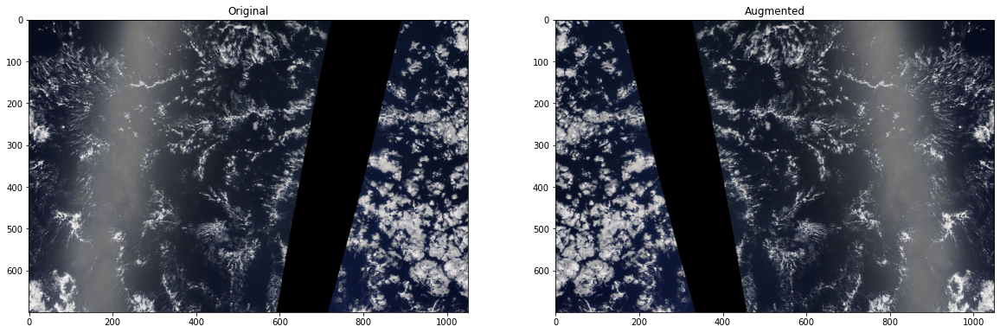

In [68]:
H_flip = albu.HorizontalFlip(p=1)
img_id = vis_augmented(H_flip)

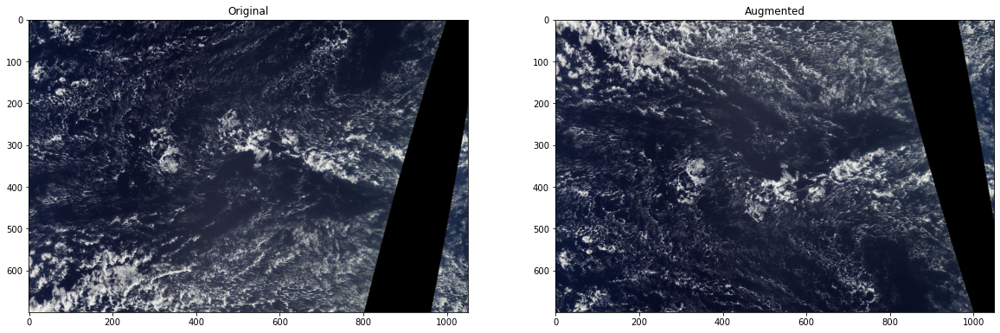

'c0952e5.jpg'

In [69]:
V_flip = albu.VerticalFlip(p=1)
vis_augmented(V_flip)

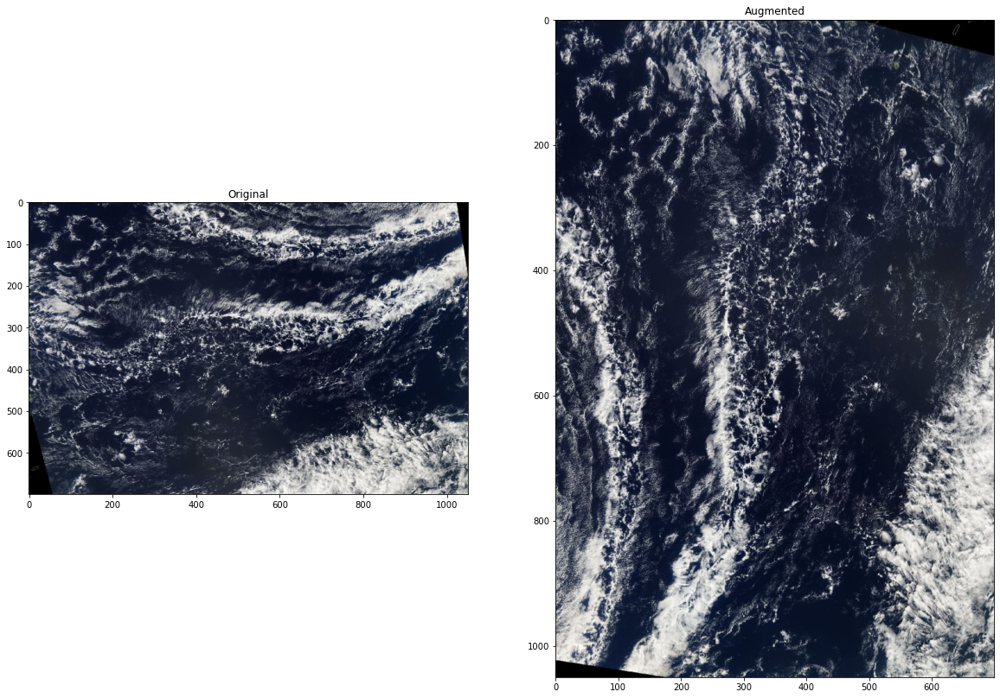

'0d24e80.jpg'

In [70]:
transpose = albu.Transpose(p=1)
vis_augmented(transpose)

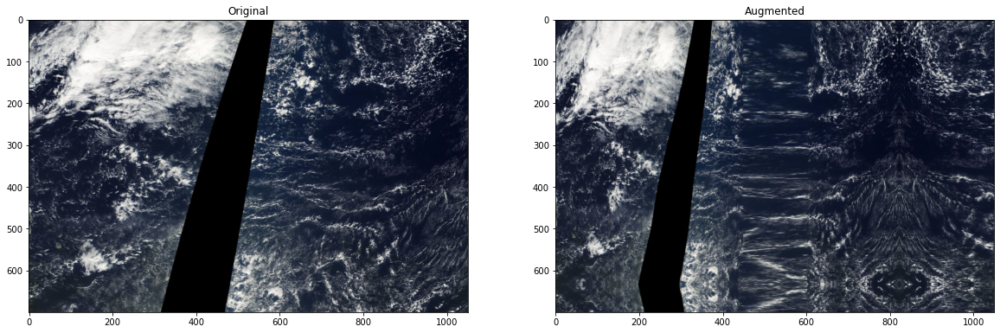

In [71]:
g_distro = albu.GridDistortion(num_steps=7, distort_limit=0.8,p=1)
img_id = vis_augmented(g_distro)

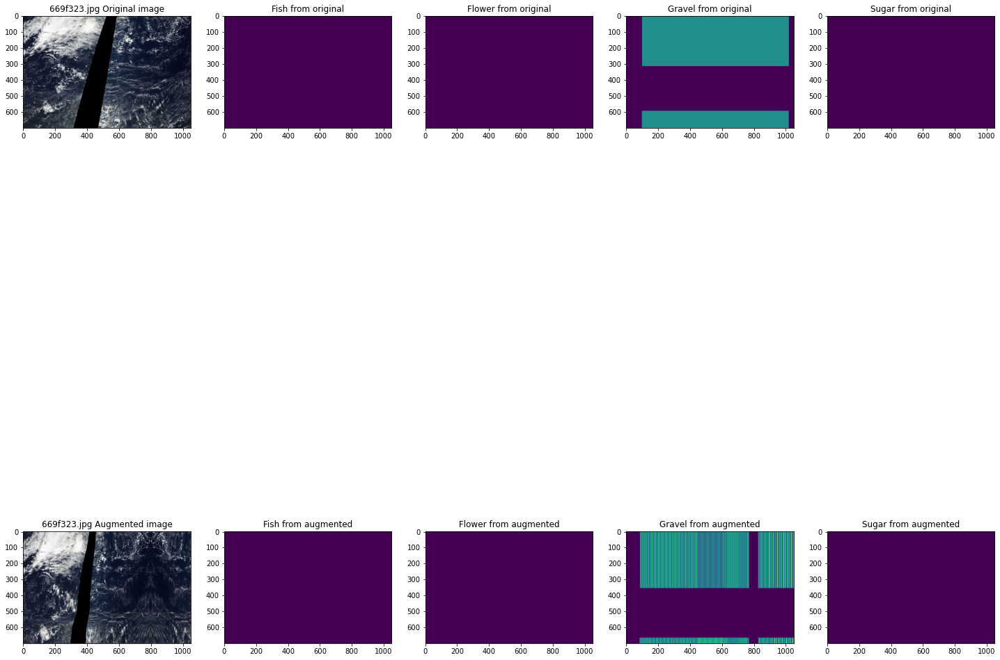

In [72]:
vis_aug_with_masks(img_id,g_distro)

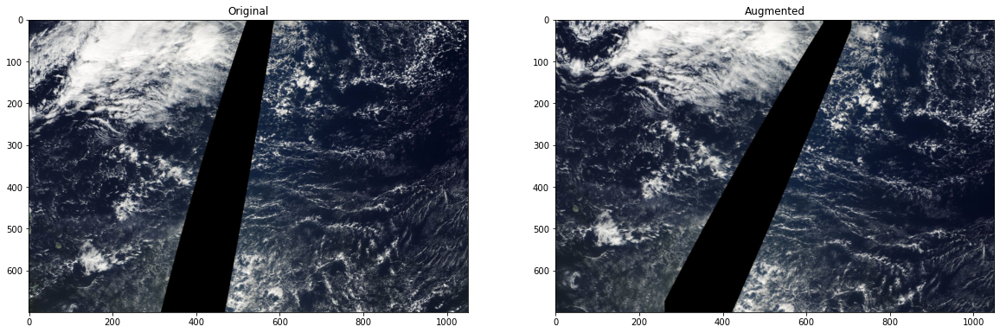

In [73]:
SSR = albu.ShiftScaleRotate(shift_limit=0.1,scale_limit=0.5, rotate_limit=90,interpolation=1, border_mode=4)
img_id = vis_augmented(SSR)

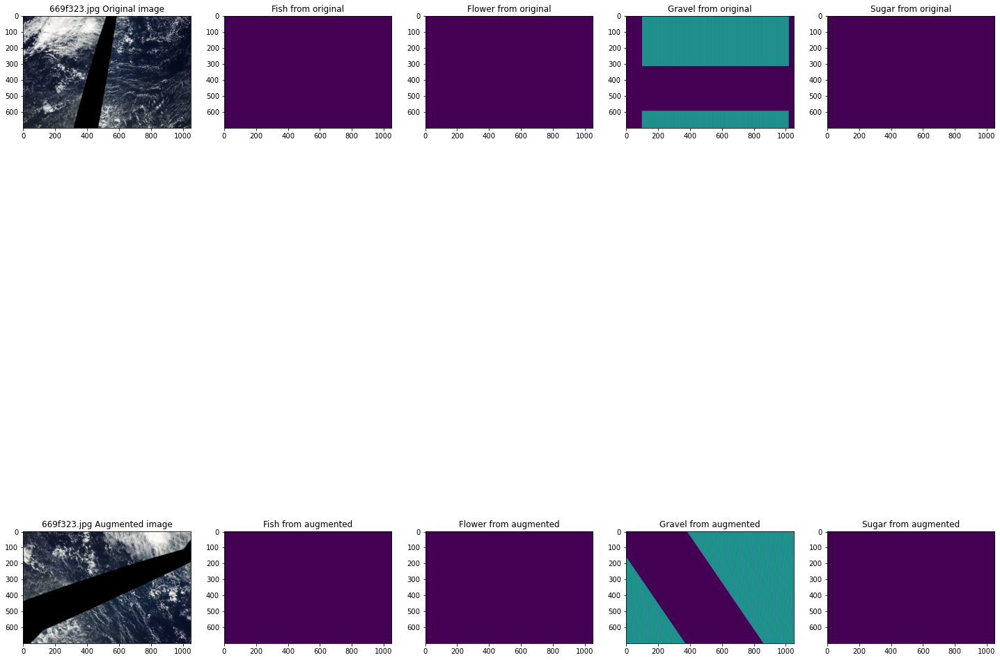

In [74]:
vis_aug_with_masks(img_id,SSR)

In [75]:
flip = albu.Flip(p=1)
compse = albu.Compose([ flip,OneOf([SSR,g_distro],p=1)])

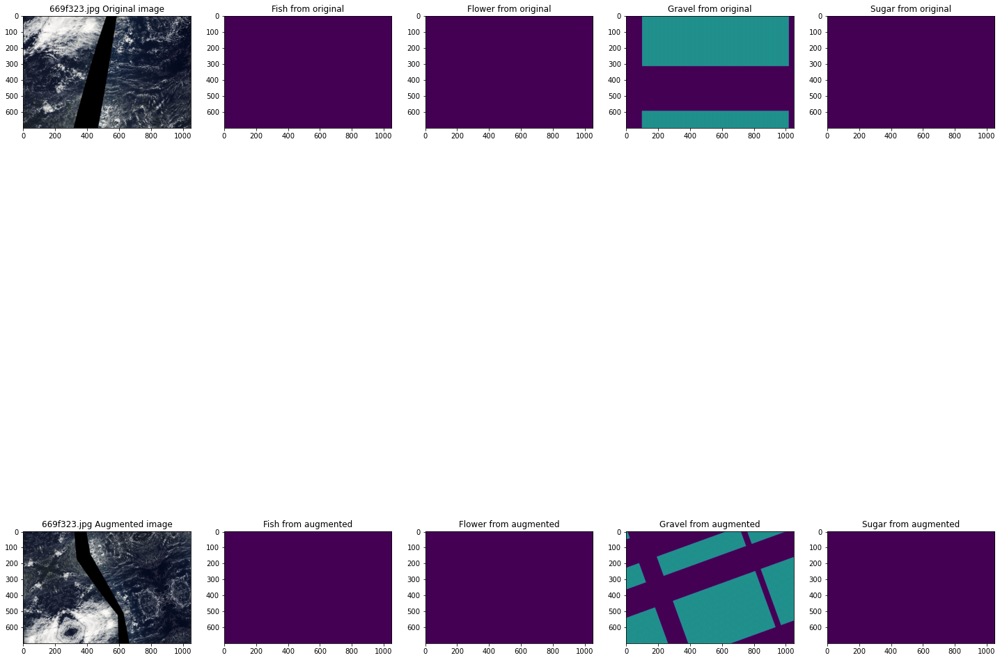

In [76]:
vis_aug_with_masks(img_id,compse)

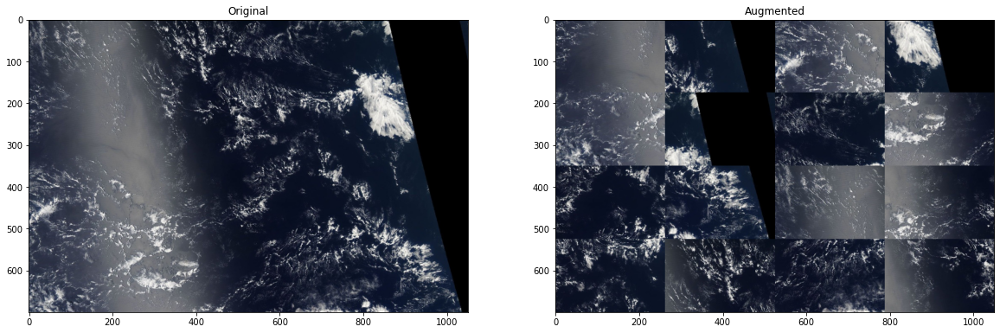

In [77]:
grid_shuffle = albu.RandomGridShuffle(grid=(4,4),p=1)
img_id = vis_augmented(grid_shuffle)

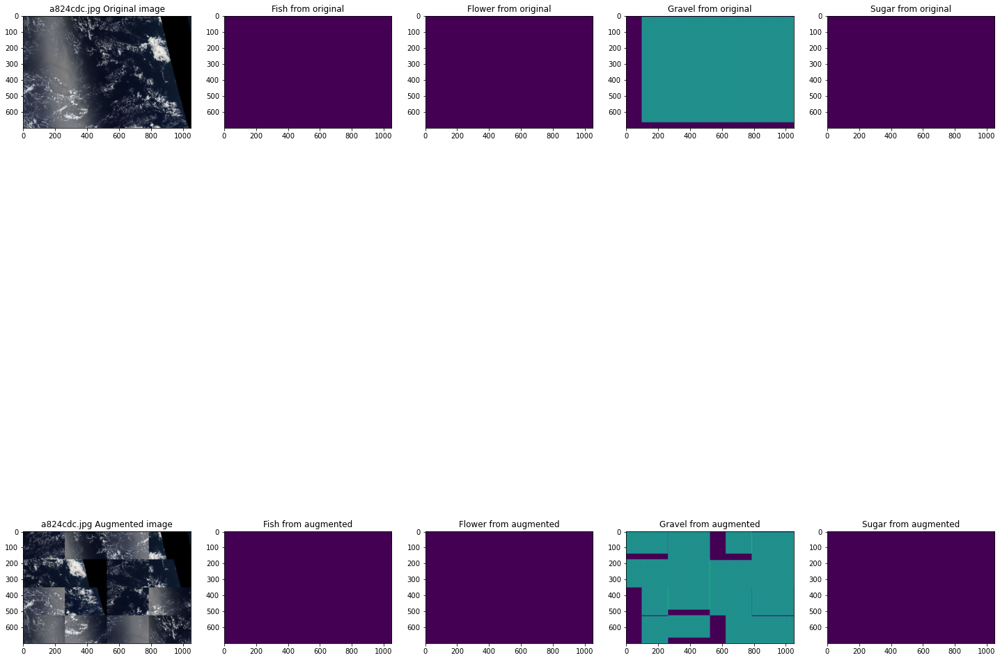

In [78]:
vis_aug_with_masks(img_id,grid_shuffle)

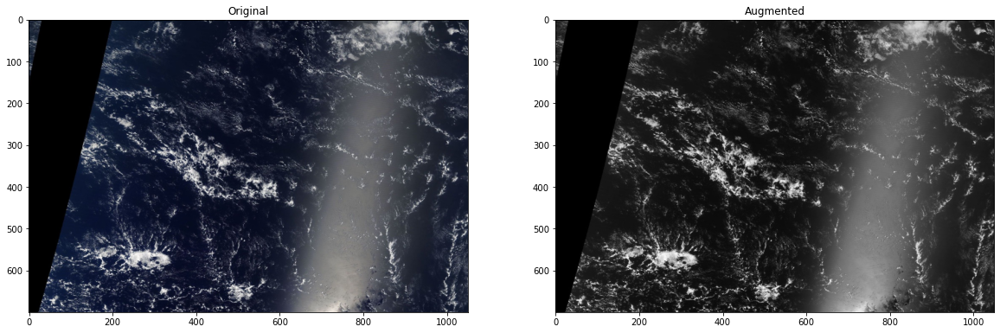

In [79]:
gray_img = albu.ToGray(p=1)
img_id = vis_augmented(gray_img)

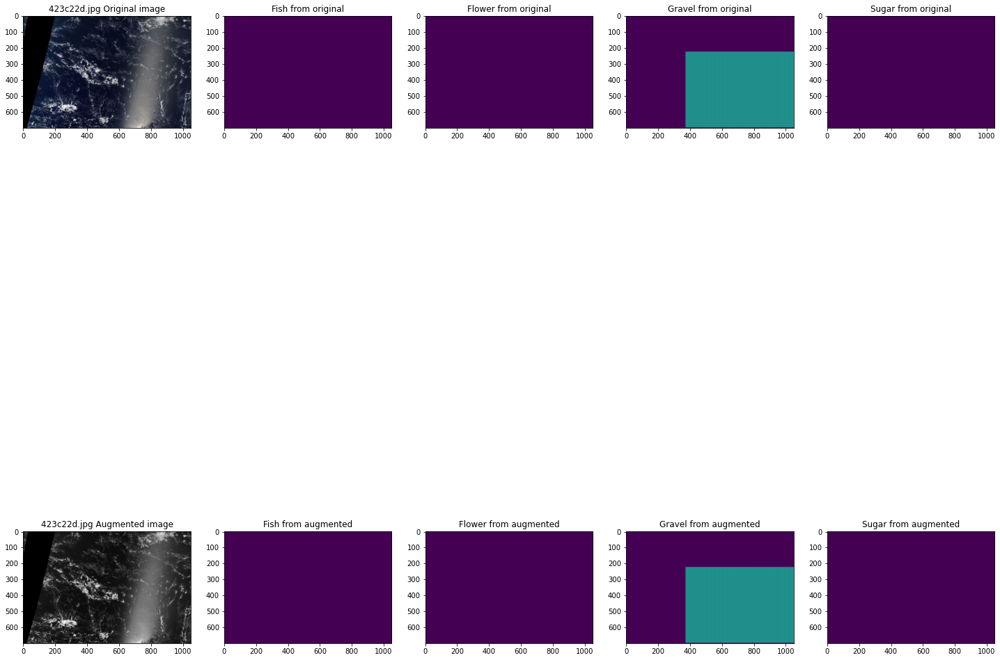

In [80]:
vis_aug_with_masks(img_id,gray_img)

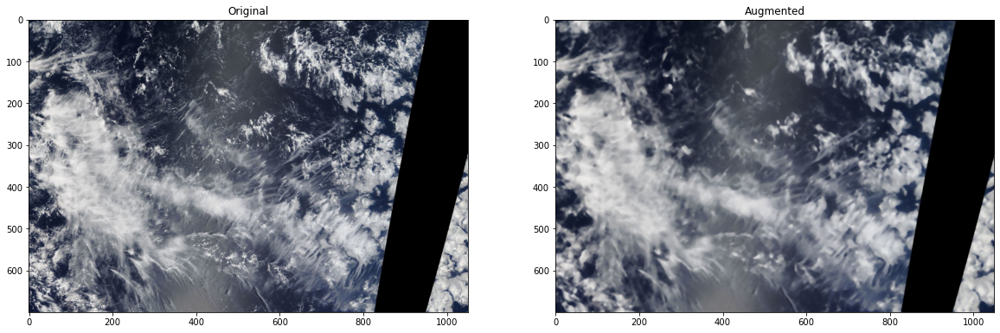

In [81]:
median_blur = albu.MedianBlur(blur_limit = 11 , p=1)
img_id = vis_augmented(median_blur)

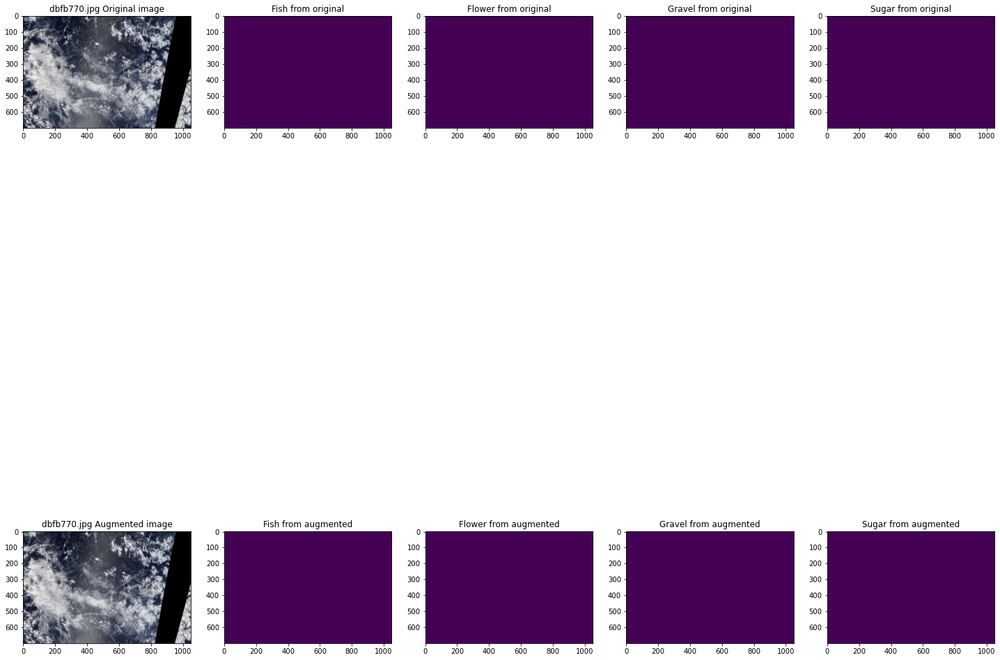

In [82]:
vis_aug_with_masks(img_id,median_blur)

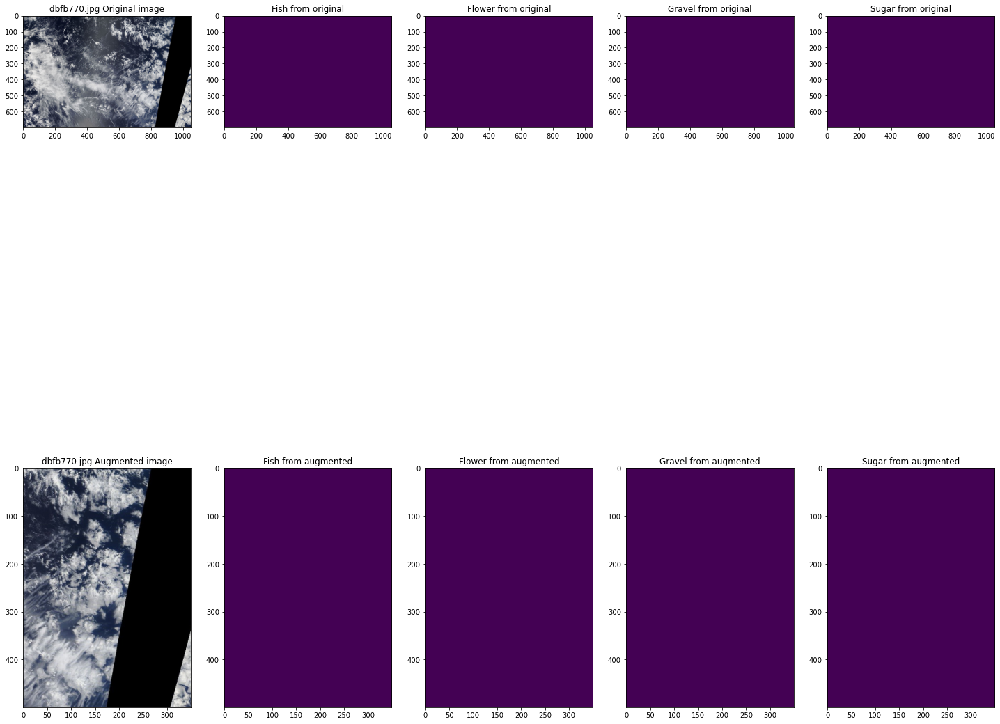

In [83]:
crop_non_empty_mask = albu.CropNonEmptyMaskIfExists(500,350,p=1)
vis_aug_with_masks(img_id,crop_non_empty_mask)

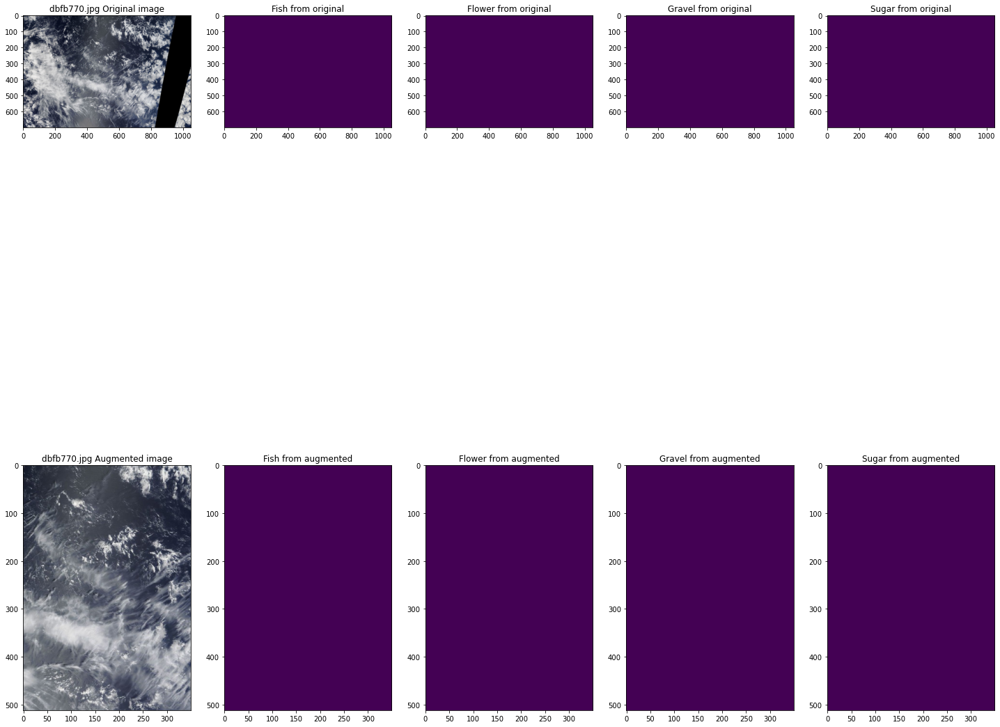

In [84]:
crop = albu.CenterCrop(512,350,p=1)
vis_aug_with_masks(img_id,crop)

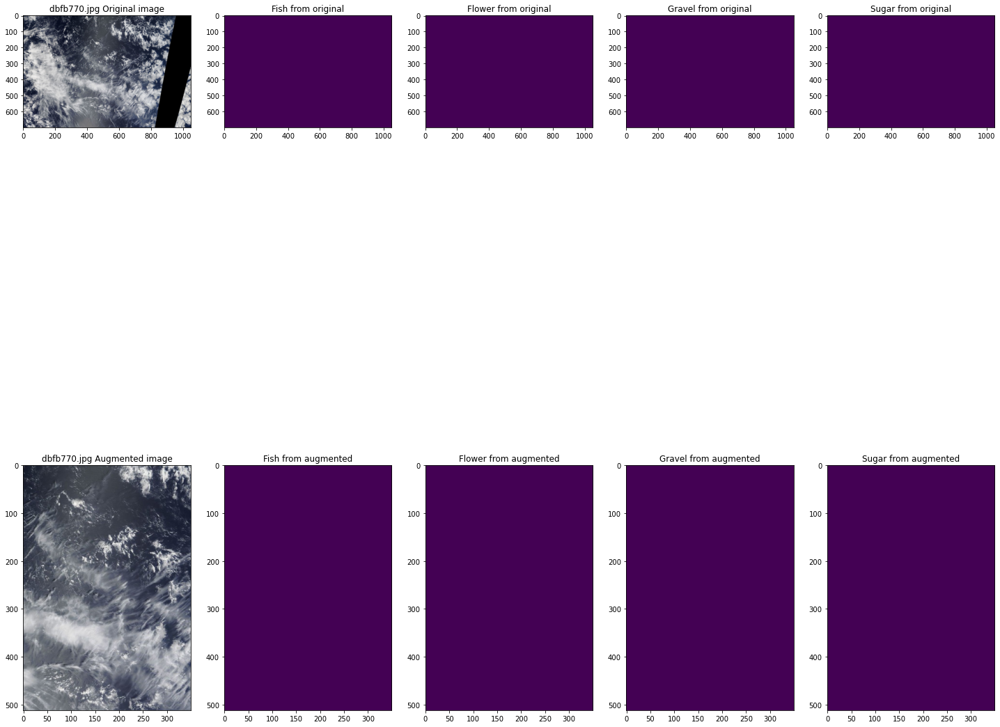

In [85]:
r_crop = albu.RandomCrop(512,350,p=1)
vis_aug_with_masks(img_id,crop)

# DataLoader

In [15]:
class CloudDataset(Dataset):
    def __init__(self,df: pd.DataFrame,img_ids, transforms=None,preprocessing = None):
        self.df = df
        self.img_ids = img_ids
        self.transforms = transforms
        self.preprocessing = preprocessing

    def __getitem__(self, idx):
        image_name = self.img_ids[idx]
        mask = make_mask(self.df, image_name)
        image_path = os.path.join('../input/cloudresized/cloud_trainData/', image_name)
        
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        if self.transforms:
            augmented = self.transforms(image=img, mask=mask)
            img = augmented["image"]
            mask = augmented["mask"]
        
        if self.preprocessing:
            preprocess = self.preprocessing(image=img, mask=mask)
            img = preprocess['image']
            mask = preprocess['mask']
            
        
        mask = torch.tensor(mask)
        mask = mask.transpose(0,2)
        mask = mask.transpose(1,2)
           
        return img, mask

    def __len__(self):
        return len(self.img_ids)

# Training Loop

In [16]:
#img_ids as a full paths
def train(epochs,model,train_ids,validation_ids,augmentation_dict,train_df,batch_size,optimizer,criterion ,device,scheduler,model_name_save):
    
    train_losses, valid_losses , dice_scores ,val_accus = [] , [] , [] , []
    valid_loss_min = 10
         
    train_aug = augmentation_dict['train']
    valid_aug = augmentation_dict['valid']
    preprocess = augmentation_dict['preprocess']
    model = model.to(device)
        
    train_set = CloudDataset(train_df ,train_ids ,transforms = train_aug, preprocessing = preprocess)
    train_loader = DataLoader(train_set,batch_size)
        
    validation_set = CloudDataset(train_df,validation_ids ,transforms = valid_aug , preprocessing = preprocess)
    validation_loader = DataLoader(validation_set,batch_size)
        
    for e in range(epochs):

            train_loss = 0
            model.train()
            for (imgs ,masks) in tqdm(train_loader,desc = 'train'):
                #forward+backward   
                imgs , masks = imgs.float().to(device) ,masks.long().to(device)
                optimizer.zero_grad()
                outputs = model(imgs)
                loss = criterion(outputs, masks)
                loss.backward()
                optimizer.step()

                train_loss += loss.item()#runnung loss

                del imgs , masks , outputs
                
            print("finished train")
            train_loss = (train_loss/len(train_loader.dataset))*batch_size

            model.eval()
            with torch.no_grad():
                valid_loss = 0
                dice_score = 0
                total_prediction = 0
                correct_predictions = 0
                for imgs, masks in tqdm(validation_loader ,desc = 'validation'):

                        imgs, masks = imgs.float().to(device),masks.long().to(device)
                        outputs = model(imgs)
                        batch_loss = criterion(outputs, masks)
                        valid_loss += batch_loss.item()
                        
                        dice_score += dice_coef(masks,outputs)
                        
                        _ , predicted = torch.max(outputs.data, 1 , keepdim = True)
                        total_prediction += masks.nelement()
                        correct_predictions += predicted.eq(masks.data).sum().item()
                        val_accuracy = 100 * correct_predictions/total_prediction
                        del imgs,masks,outputs


            print("finished validation")


            valid_loss = (valid_loss/len(validation_loader.dataset))*batch_size
            dice_score = (dice_score/len(validation_loader.dataset))*batch_size

            train_losses.append(train_loss)
            valid_losses.append(valid_loss)
            dice_scores.append(dice_score)
            val_accus.append(val_accuracy)

            print(f"epoch : {e}/{epochs} , train loss : {train_loss} , validation loss : {valid_loss} , dice score : {dice_score} , valid accuracy : {val_accuracy}")

            if valid_loss <= valid_loss_min:
                print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
                valid_loss_min,
                valid_loss))
                torch.save(model.state_dict(), model_name_save)
                valid_loss_min = valid_loss

            scheduler.step()
    return [train_losses,valid_losses,dice_scores,val_accus]        

# Choosen Augmentation

In [19]:
g_distro = albu.GridDistortion(num_steps=7, distort_limit=0.8,p=1)
SSR = albu.ShiftScaleRotate(shift_limit=0.1,scale_limit=0.5, rotate_limit=90,interpolation=1, border_mode=4)
flip = albu.Flip(p=1)

gray_img = albu.ToGray(p=0.6)
median_blur = albu.MedianBlur(blur_limit = 9 , p=0.8)

center_crop = albu.CenterCrop(512,512,p=1)
random_crop = albu.RandomCrop(512,512,p=1)

resize = albu.Resize(704 , 1024 , p=1)

In [20]:
train_aug = albu.Compose([flip , 
                          OneOf([SSR,g_distro],p=1),
                          gray_img,
                          median_blur,
                          OneOf([center_crop,random_crop],p=1)])

preprocess = albu.Compose([ToTensorV2(p=1) ])

valid_aug = albu.Compose([flip,
                          OneOf([SSR,g_distro],p=1),
                          gray_img,
                          median_blur,resize])

# Model 1 and Hyperparameters

In [32]:
model = smp.Unet(
        encoder_name = 'resnet50',
        encoder_weights = 'imagenet',
        classes = 4,
        activation=None)

In [33]:
num_epochs = 20

batch_size = 10

optimizer = torch.optim.Adam([
    {'params': model.decoder.parameters(), 'lr': 1e-2}, 
    {'params': model.encoder.parameters(), 'lr': 1e-3},  
])

scheduler = ReduceLROnPlateau(optimizer, factor=0.15, patience=2)

criterion = smp.utils.losses.JaccardLoss(eps=1.)

device = 'cuda'

model_name_save = '/kaggle/working/Unet_model_1.pth'

augmentation_dict = {'train':train_aug , 'valid': valid_aug , 'preprocess' : preprocess}

# Train with U-net

In [21]:
kf = KFold(n_splits = 4, shuffle=True )

train_idx , validation_idx = next(kf.split(train_img))

train_ids = [train_img[_index] for _index in train_idx]
validation_ids = [train_img[_index] for _index in validation_idx]

In [22]:
cd '/kaggle'

/kaggle


In [23]:
cd '/kaggle/working'

/kaggle/working


In [24]:
pwd

'/kaggle/working'

In [ ]:
results = train(num_epochs , model , train_ids,validation_ids , augmentation_dict , train_df , batch_size , optimizer , criterion , device , scheduler ,  model_name_save )

# Plot the statistics

In [ ]:
loss , val_loss , dice_score , accuracy = results
epochs = [i for i in range(1,21)]
plt.figure(figsize = (15,15))
plt.xlabel("Epochs")
plt.ylabel("loss")
plt.plot(epochs , train_loss , val_loss)
plt.savefig("train_val_loss.png")
plt.show()

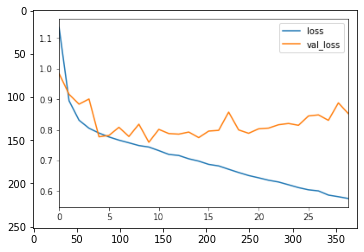

In [65]:
fig_1 = plt.imread('../input/metrics/train_val_loss.png')
plt.imshow(fig_1)

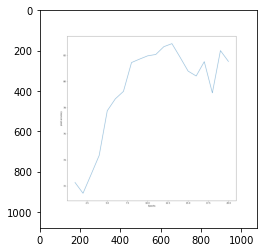

In [66]:
fig_2 = plt.imread('../input/metrics/accuracy.png')
plt.imshow(fig_2)

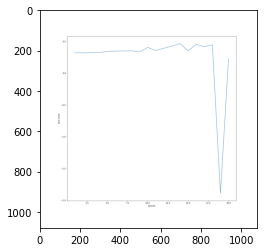

In [67]:
fig_3 = plt.imread('../input/metrics/dice_score.png')
plt.imshow(fig_3)

Something went wrong in epoch number 18 , so I deleted that loss

# Train with FPN

In [28]:
train_idx , validation_idx = next(kf.split(train_img))

train_ids = [train_img[_index] for _index in train_idx]
validation_ids = [train_img[_index] for _index in validation_idx]

In [36]:
FPN_model = smp.FPN(encoder_name = 'resnet50',
                    encoder_weights = 'imagenet',
                    classes = 4,
                    activation=None)

num_epochs = 20

batch_size = 10

optimizer = torch.optim.SGD([
    {'params': FPN_model.decoder.parameters(), 'lr': 0.01}, 
    {'params': FPN_model.encoder.parameters(), 'lr': 0.01}, ],
      momentum = 0.7)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=6, gamma = 0.1)

criterion = smp.utils.losses.JaccardLoss(eps=1.)

device = 'cuda'

model_name_save = '/kaggle/working/FPN_model_2.pth'

In [37]:
results = train(num_epochs , FPN_model , train_ids,validation_ids , augmentation_dict , train_df , batch_size , optimizer , criterion , device , scheduler ,  model_name_save)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



finished train



finished validation
epoch : 0/20 , train loss : 0.8034941483828355 , validation loss : 0.7678087624011489 , dice score : 0.3702332079410553 , valid accuracy : 0.0
Validation loss decreased (10.000000 --> 0.767809).  Saving model ...



finished train



finished validation
epoch : 1/20 , train loss : 0.7942865759550005 , validation loss : 0.8582634412735248 , dice score : 0.24902892112731934 , valid accuracy : 0.0



finished train



finished validation
epoch : 2/20 , train loss : 0.8238288285699013 , validation loss : 0.8152810721063923 , dice score : 0.3104242980480194 , valid accuracy : 13.105223986301946



finished train



finished validation
epoch : 3/20 , train loss : 0.7712841062605409 , validation loss : 0.8722212332654704 , dice score : 0.22637999057769775 , valid accuracy : 0.4175491318006054



finished train



finished validation
epoch : 4/20 , train loss : 0.8386728414094695 , validation loss : 0.8257829257714809 , dice score : 0.2950085997581482 , valid accuracy : 0.0



finished train



finished validation
epoch : 5/20 , train loss : 0.7673400769502053 , validation loss : 0.871361693892448 , dice score : 0.22941213846206665 , valid accuracy : 0.0



finished train



finished validation
epoch : 6/20 , train loss : 0.8596749959971367 , validation loss : 0.8723344649010283 , dice score : 0.2280200868844986 , valid accuracy : 0.0



finished train



finished validation
epoch : 7/20 , train loss : 0.8596644130906789 , validation loss : 0.8719740996020426 , dice score : 0.2283945530653 , valid accuracy : 0.0



finished train



finished validation
epoch : 8/20 , train loss : 0.8608165188383861 , validation loss : 0.8701961355924435 , dice score : 0.23113997280597687 , valid accuracy : 0.0



finished train



finished validation
epoch : 9/20 , train loss : 0.8603800722129531 , validation loss : 0.8701880307359153 , dice score : 0.23116783797740936 , valid accuracy : 0.0



finished train



finished validation
epoch : 10/20 , train loss : 0.8606271357591362 , validation loss : 0.8708840797681472 , dice score : 0.23010742664337158 , valid accuracy : 0.0



finished train



finished validation
epoch : 11/20 , train loss : 0.8602752108995935 , validation loss : 0.8706525425818126 , dice score : 0.23056836426258087 , valid accuracy : 0.0



finished train



finished validation
epoch : 12/20 , train loss : 0.8599268290616963 , validation loss : 0.8713636689677716 , dice score : 0.2293197512626648 , valid accuracy : 0.0



finished train



finished validation
epoch : 13/20 , train loss : 0.8589607725182423 , validation loss : 0.8710210514137362 , dice score : 0.2299829125404358 , valid accuracy : 0.0


KeyboardInterrupt: 

# Train with DeepLab

In [39]:
train_idx , validation_idx = next(kf.split(train_img))

train_ids = [train_img[_index] for _index in train_idx]
validation_ids = [train_img[_index] for _index in validation_idx]

In [42]:
deeplab = smp.DeepLabV3(encoder_name = 'resnet50',
                        encoder_weights = 'imagenet',
                        classes = 4,
                        activation=None)

num_epochs = 23

batch_size = 10

optimizer = torch.optim.SGD([
    {'params': deeplab.decoder.parameters(), 'lr': 0.01}, 
    {'params': deeplab.encoder.parameters(), 'lr': 0.01}, ],
      momentum = 0.7)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=6, gamma = 0.1)

criterion = smp.utils.losses.JaccardLoss(eps=1.)

device = 'cuda'

model_name_save = '/kaggle/working/deeplab_model_3.pth'

In [43]:
results = train(num_epochs , deeplab , train_ids,validation_ids , augmentation_dict , train_df , batch_size , optimizer , criterion , device , scheduler ,  model_name_save)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


KeyboardInterrupt: 

# Ensamble

In [ ]:
class Ensemble(nn):
    def __init__(self,models=[] , w=[]):
        self.models = models
        self.w = w
    def __call__(self,x):
        result = []
        x = x.cuda()
        for w1 , m1 in zip(self.w , self.models):
            m1.cuda()
            with torch.no_grad():
                y = w1*m1(x)
                result.append(y.cpu().numpy())
        result = np.array(result)
        result = result/sum(self.w)
        return result.mean(axis=0)
        

In [ ]:
model1 = smp.Unet(
        encoder_name = 'resnet50',
        encoder_weights = 'imagenet',
        classes = 4,
        activation=None)

model1.load_state_dict(torch.load('./Unet_model_1.pth'))

model2 = smp.FPN(encoder_name = 'resnet50',
                encoder_weights = 'imagenet',
                classes = 4,
                activation=None)

model2.load_state_dict(torch.load('./FPN_model_2.pth'))

model3 = smp.DeepLabV3(encoder_name = 'resnet50',
                        encoder_weights = 'imagenet',
                        classes = 4,
                        activation=None)

model3.load_state_dict(torch.load('./deeplab_model_3.pth'))

# Predictions

In [ ]:
class_params = {0: (0.65, 10000), 1: (0.7, 10000), 2: (0.7, 10000), 3: (0.6, 10000)}
encoded_pixels = []
image_id = 0
for i, test_batch in enumerate(tqdm.tqdm(loaders['test'])):
    img , mask = test_batch
    outputs = model(img)
    del img
    for i, batch in enumerate(outputs):
        for probability in batch:
            
            probability = probability.cpu().detach().numpy()
            if probability.shape != (512, 512):
                probability = cv2.resize(probability, dsize=(512, 512), interpolation=cv2.INTER_LINEAR)
                
            predict, num_predict = post_process(sigmoid(probability), class_params[image_id % 4][0], class_params[image_id % 4][1])
            if num_predict == 0:
                encoded_pixels.append('')
            else:
                r = mask2rle(predict)
                encoded_pixels.append(r)
            image_id += 1

In [ ]:
subm = pd.read_csv("../input/understanding_cloud_organization/sample_submission.csv")
pathlist = ["../input/understanding_cloud_organization/test_images/" + i.split("_")[0] for i in subm['Image_Label']]

In [ ]:
sub['EncodedPixels'] = encoded_pixels
sub.to_csv('submission.csv', columns=['Image_Label', 'EncodedPixels'], index=False)